In [119]:
# DSC680 Project 1
# Matthew Fikes


In [120]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
import warnings
import pandas_profiling as pp
from sklearn import linear_model
import statsmodels.api as sm
warnings.filterwarnings('ignore')

In [121]:
# load dataset for location information
fips_db = pd.read_csv('data/fips.csv')

In [122]:
# load SAIPE poverty dataset with year 2017 data and select columns
pov_db = pd.read_csv('data/poverty/districts_saipe.csv')
pov_db = pov_db[pov_db['year']==2017]
pov_fields = ['leaid','fips','est_population_total','est_population_5_17_poverty']
pov_db = pov_db[pov_fields]
pov_db = pov_db.merge(fips_db,how='inner',left_on='fips',right_on='code')
pov_db.drop(columns=['fips','code'],inplace=True)
pov_db.rename(columns={'code_label': 'Location','est_population_5_17_poverty':'youth_poverty'},inplace=True)
pov_db.replace([-1,-2,-3],np.NaN,inplace=True)

In [123]:
pov_db['youth_poverty'].mean()

689.7562396006656

In [124]:
pov_db['est_population_total'].mean()

26303.400998336107

Text(0.5, 0, 'Children 5-17 in Poverty (in hundred thousands)')

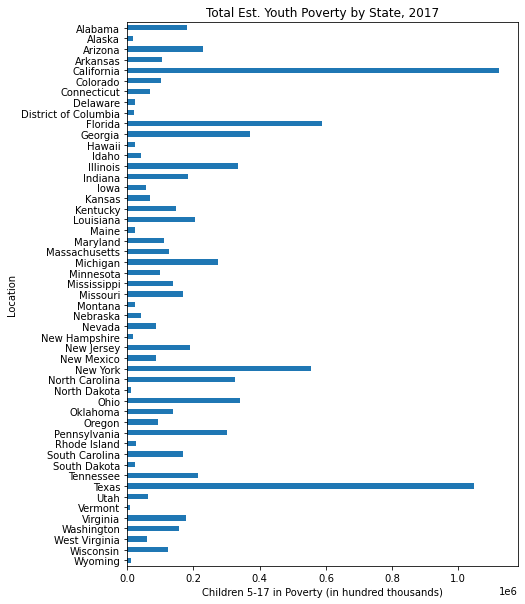

In [125]:
# plot poverty by state
pov_groups = pov_db.groupby(['Location'])['youth_poverty'].sum()
pov_groups = pov_groups.sort_index(axis=0,ascending=False)
pov_groups.plot.barh(x='Location',figsize=(7,10))
plt.title('Total Est. Youth Poverty by State, 2017')
plt.xlabel('Children 5-17 in Poverty (in hundred thousands)')

In [126]:
# load common core financial data for 2017 and columns needed
fin_db = pd.read_csv('data/finance/districts_ccd_finance.csv')
fin_db = fin_db[fin_db['year']==2017]
fin_fields = ['leaid','fips','rev_total','exp_total','exp_current_elsec_total','enrollment_fall_responsible']
fin_db = fin_db[fin_fields]
fin_db = fin_db.merge(fips_db,how='inner',left_on='fips',right_on='code')
fin_db.drop(columns=['fips','code'],inplace=True)
fin_db.rename(columns={'code_label': 'Location','exp_current_elsec_total':'exp_edu'},inplace=True)
fin_db.replace([-1,-2,-3],np.NaN,inplace=True)

In [127]:
# load EdFacts graduate data and get right year and columns needed
grad_db = pd.read_csv('data/grad/districts_edfacts_grad_rates_2017.csv')
grad_db = grad_db[(grad_db['year']==2017) & (grad_db['lep']==99) & (grad_db['race']==99) & (grad_db['foster_care']==99)]
grad_db.drop(columns=['lea_name','race','lep','foster_care','leaid_num','year'],inplace=True)
grad_db = grad_db.merge(fips_db,how='inner',left_on='fips',right_on='code')
grad_db.drop(columns=['fips','code'],inplace=True)
grad_db.rename(columns={'code_label': 'Location'},inplace=True)



In [128]:
# filter grad set for special categories
sp_cols = ['disability','econ_disadvantaged','homeless','cohort_num']
grad_econ = grad_db[grad_db['econ_disadvantaged']==1].drop(columns=sp_cols)
grad_home = grad_db[grad_db['homeless']==1].drop(columns=sp_cols)
grad_total = grad_db[(grad_db['disability']==99) & (grad_db['homeless']==99) & (grad_db['econ_disadvantaged']==99)].drop(columns=sp_cols)

In [129]:
# make grad rates into dicts

grad_home.rename(columns={'grad_rate_low':'gr_home_low','grad_rate_midpt':'gr_home_mid','grad_rate_high':'gr_home_hi'},inplace=True)
grad_econ.rename(columns={'grad_rate_low':'gr_econ_low','grad_rate_midpt':'gr_econ_mid','grad_rate_high':'gr_econ_hi'},inplace=True)
grad_total.rename(columns={'grad_rate_low':'gr_tot_low','grad_rate_midpt':'gr_tot_mid','grad_rate_high':'gr_tot_hi'},inplace=True)




In [130]:
#merge together grad rate dataframes

grad_df = grad_total.merge(grad_econ,on='leaid',how='inner')
grad_df.drop(columns='Location_x',inplace=True)
grad_df.rename(columns={'Location_y':'Location'},inplace=True)
grad_df.replace([-1,-2,-3],np.NaN,inplace=True)


In [131]:
# group datasets together
merge_data = grad_df.merge(fin_db,on='leaid',how='left')
merge_data.drop(columns='Location_x',inplace=True)
merge_data = merge_data.merge(pov_db,on='leaid',how='left')
merge_data.drop(columns='Location',inplace=True)
merge_data.rename(columns={'Location_y':'Location'},inplace=True)

In [132]:
# Run pandas profiling for data exploration

pp.ProfileReport(merge_data) #to display the report

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [133]:
# make normalized set and group

loc_cols = merge_data[['Location','leaid']]
dat_cols = merge_data.drop(columns=['Location','leaid'])
norm_dat = (dat_cols-dat_cols.min())/(dat_cols.max()-dat_cols.min())
norm_df = pd.concat([loc_cols, norm_dat], axis=1)
norm_df.dropna(axis=0,inplace=True)
group_norm = norm_df.groupby('Location').mean()
group_df = merge_data.groupby('Location').mean()

In [134]:
# plot for economically-disadvantaged student grad rates
%matplotlib inline
hovertext=[]
for i in range(len(group_df['gr_econ_mid'])):
    str_loc = group_df.index[i]
    str_low = round(group_df['gr_econ_low'][i],2)
    str_mid = round(group_df['gr_econ_mid'][i],2)
    str_hi = round(group_df['gr_econ_hi'][i],2)
    hovertext.append('Location: {0}<br>Low: {1}%<br>Midpoint: {2}%<br>High: {3}%'.format(str_loc,str_low,str_mid,str_hi))

fig1 = go.Figure(data=go.Ohlc(x=group_df.index,
                open=group_df['gr_econ_mid'],
                high=group_df['gr_econ_hi'],
                low=group_df['gr_econ_low'],
                close=group_df['gr_econ_mid'],
                text=hovertext,
                hoverinfo='text',
                increasing_line_color= 'blue', decreasing_line_color= 'blue'))

fig1.update_layout(
    title='Economically-Disadvantaged Student High School Graduation Rates',
    yaxis_title='Graduation Rate (%)',
    xaxis_rangeslider_visible=False
    
)

fig1.show()

In [135]:
# plot overall grad rates
%matplotlib inline
hovertext=[]
for i in range(len(group_df['gr_tot_mid'])):
    str_loc = group_df.index[i]
    str_low = round(group_df['gr_tot_low'][i],2)
    str_mid = round(group_df['gr_tot_mid'][i],2)
    str_hi = round(group_df['gr_tot_hi'][i],2)
    hovertext.append('Location: {0}<br>Low: {1}%<br>Midpoint: {2}%<br>High: {3}%'.format(str_loc,str_low,str_mid,str_hi))

fig1 = go.Figure(data=go.Ohlc(x=group_df.index,
                open=group_df['gr_tot_mid'],
                high=group_df['gr_tot_hi'],
                low=group_df['gr_tot_low'],
                close=group_df['gr_tot_mid'],
                text=hovertext,
                hoverinfo='text',
                increasing_line_color= 'green', decreasing_line_color= 'green'))

fig1.update_layout(
    title='Total Student High School Graduation Rates',
    yaxis_title='Graduation Rate (%)',
    xaxis_rangeslider_visible=False
    
)

fig1.show()

In [136]:
# plot homeless grad rates
%matplotlib inline
grad_home.replace([-1,-2,-3],np.NaN,inplace=True)
home_grp = grad_home.groupby('Location').mean()
hovertext=[]
for i in range(len(home_grp['gr_home_mid'])):
    str_loc = home_grp.index[i]
    str_low = round(home_grp['gr_home_low'][i],2)
    str_mid = round(home_grp['gr_home_mid'][i],2)
    str_hi = round(home_grp['gr_home_hi'][i],2)
    hovertext.append('Location: {0}<br>Low: {1}%<br>Midpoint: {2}%<br>High: {3}%'.format(str_loc,str_low,str_mid,str_hi))

fig1 = go.Figure(data=go.Ohlc(x=home_grp.index,
                open=home_grp['gr_home_mid'],
                high=home_grp['gr_home_hi'],
                low=home_grp['gr_home_low'],
                close=home_grp['gr_home_mid'],
                text=hovertext,
                hoverinfo='text',
                increasing_line_color= 'red', decreasing_line_color= 'red'))

fig1.update_layout(
    title='Homeless Student High School Graduation Rates',
    yaxis_title='Graduation Rate (%)',
    xaxis_rangeslider_visible=False
    
)

fig1.show()

In [137]:
# OLS Model
X = norm_df[['youth_poverty','exp_edu','rev_total','est_population_total','exp_total']]

Y = norm_df['gr_econ_hi']
 
# with sklearn
regr = linear_model.LinearRegression()
regr.fit(X, Y)

print('Intercept: \n', regr.intercept_)
print('Coefficients: \n', regr.coef_)

Intercept: 
 0.9071622579861827
Coefficients: 
 [-0.17168234 -1.23306237  2.41392408 -0.90667582 -0.85810802]


In [138]:
# with statsmodels
X = sm.add_constant(X) # adding a constant
 
model = sm.OLS(Y, X).fit()
predictions = model.predict(X) 
 
print_model = model.summary()
print(print_model)

                            OLS Regression Results                            
Dep. Variable:             gr_econ_hi   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.030
Method:                 Least Squares   F-statistic:                     47.02
Date:                Fri, 24 Sep 2021   Prob (F-statistic):           5.09e-48
Time:                        22:41:16   Log-Likelihood:                 5722.3
No. Observations:                7409   AIC:                        -1.143e+04
Df Residuals:                    7403   BIC:                        -1.139e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.9072 

In [139]:
# print grad difference
records = []
for index,row in group_df.iterrows():
    record = {}
    grad_dif = row['gr_tot_low'] - row['gr_econ_low']
    row['grad_dif'] = grad_dif
    record['Location'] = index
    record['dif'] = grad_dif
    print('{0}:{1}'.format(index,grad_dif))

Alabama:6.247638471446962
Alaska:9.67014712861888
Arizona:8.226726726726724
Arkansas:2.9707121167597137
California:3.1231794236132515
District of Columbia:7.61904761904762
Florida:5.08219178082193
Georgia:3.302083333333343
Hawaii:5.0
Idaho:7.4820875718708635
Iowa:15.011566173682212
Kentucky:3.6824586121873892
Louisiana:3.1866956241956217
Maine:11.578947368421055
Maryland:7.1200000000000045
Massachusetts:13.524462310176588
Michigan:8.38322050986605
Minnesota:14.138957846872316
Mississippi:2.2466666666666697
Missouri:11.175457875457866
Montana:7.825974025974027
Nebraska:16.3555137057962
Nevada:3.4235294117647044
New Hampshire:13.543033361368089
New Jersey:12.247456152095324
New Mexico:5.093855551563067
North Carolina:9.034306869600982
North Dakota:15.325716703691945
Ohio:15.128290833288403
Oklahoma:8.438426110195039
Oregon:6.44964091784901
Pennsylvania:9.906118521705878
Rhode Island:8.272946859903385
South Carolina:-1.0574712643678197
South Dakota:18.079693795326357
Tennessee:6.960392441